# NYC MTA Bus Automated Camera Enforcement Violation Analysis

## Project Overview

This notebook presents a comprehensive analysis of NYC MTA Bus Automated Camera Enforcement Violations. We explore temporal and spatial patterns in violation data to understand when and where violations are most likely to occur. The analysis combines statistical visualization techniques with interactive geographic mapping to provide actionable insights for urban transportation planning and enforcement strategy optimization.

## Analysis Goals

1. **Temporal Analysis**: Identify peak violation times across different days of the week and hours
2. **Spatial Analysis**: Map violation hotspots across NYC geography
3. **Pattern Recognition**: Discover correlations between time periods and violation frequency
4. **Interactive Visualization**: Create dynamic tools for exploring violation patterns

## Dataset Information

The dataset contains MTA Bus Automated Camera Enforcement Violations with the following key features:
- Temporal data: First occurrence timestamps
- Geographic data: Violation latitude and longitude coordinates
- Contextual data: Bus route information, violation types, and location details

## Section 1: Data Loading and Initial Exploration

We begin by loading the required libraries and examining the structure of our violation dataset to understand what data is available for analysis.

In [2]:
# Import required libraries for data analysis and visualization
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import folium
from folium.plugins import HeatMap
import warnings
warnings.filterwarnings('ignore')

# Set visualization parameters
plt.rcParams['figure.figsize'] = (12, 8)
sns.set_style("whitegrid")

print("Libraries imported successfully")

Libraries imported successfully


In [3]:
# Load the violations dataset
print("Loading MTA Bus Automated Camera Enforcement Violations dataset...")
df = pd.read_csv("MTA_Bus_Automated_Camera_Enforcement_Violations.csv")

# Display basic information about the dataset
print(f"Dataset shape: {df.shape}")
print(f"Total violations recorded: {len(df):,}")
print("\nColumn names and types:")
print(df.dtypes)

# Display first few rows to understand data structure
print("\nFirst 5 rows of the dataset:")
df.head()

Loading MTA Bus Automated Camera Enforcement Violations dataset...
Dataset shape: (1663119, 15)
Total violations recorded: 1,663,119

Column names and types:
Violation ID                int64
Vehicle ID                 object
First Occurrence           object
Last Occurrence            object
Violation Status           object
Violation Type             object
Bus Route ID               object
Violation Latitude        float64
Violation Longitude       float64
Stop ID                     int64
Stop Name                  object
Bus Stop Latitude         float64
Bus Stop Longitude        float64
Violation Georeference     object
Bus Stop Georeference      object
dtype: object

First 5 rows of the dataset:
Dataset shape: (1663119, 15)
Total violations recorded: 1,663,119

Column names and types:
Violation ID                int64
Vehicle ID                 object
First Occurrence           object
Last Occurrence            object
Violation Status           object
Violation Type             

,Violation ID,Vehicle ID,First Occurrence,Last Occurrence,Violation Status,Violation Type,Bus Route ID,Violation Latitude,Violation Longitude,Stop ID,Stop Name,Bus Stop Latitude,Bus Stop Longitude,Violation Georeference,Bus Stop Georeference
0,489749182,c5ae1411153b52556a1e648cc80d718aa519a4bdd189ab...,08/20/2025 11:12:08 PM,08/21/2025 12:24:08 AM,TECHNICAL ISSUE/OTHER,MOBILE BUS STOP,BX36,40.840509,-73.881189,102498,EAST TREMONT AV/VYSE AV,40.841076,-73.882483,POINT (-73.881189 40.840509),POINT (-73.882483 40.841076)
1,489744714,df9044acf85cf55488aea4cd3ce1d0e17ef050551726b6...,08/20/2025 11:48:59 PM,08/20/2025 11:54:47 PM,EXEMPT - BUS/PARATRANSIT,MOBILE BUS STOP,BX28,40.874017,-73.890646,100080,PAUL AV/BEDFORD PARK BLVD,40.874629,-73.891539,POINT (-73.890646 40.874017),POINT (-73.891539 40.874629)
2,489743631,eb5a337966ba65f66ab1db8e169d2446a4fb429b0efc63...,08/20/2025 10:33:13 PM,08/20/2025 11:56:02 PM,TECHNICAL ISSUE/OTHER,MOBILE DOUBLE PARKED,Q53+,40.721971,-73.867136,550473,WOODHAVEN BLVD/PENELOPE AV,40.722487,-73.867736,POINT (-73.867136 40.721971),POINT (-73.867736 40.722487)
3,489741945,3f877f70d9b253515a945be807c9c62d5814949f810310...,08/20/2025 10:50:45 PM,08/20/2025 11:32:43 PM,EXEMPT - OTHER,MOBILE BUS STOP,Q44+,40.762529,-73.831728,501140,UNION ST/35 AV,40.765422,-73.827944,POINT (-73.831728 40.762529),POINT (-73.827944 40.765422)
4,489741940,7feac037b62d591ffb1214e356157f3dd197fc22fee5bb...,08/20/2025 10:52:57 AM,08/20/2025 11:16:57 AM,EXEMPT - EMERGENCY VEHICLE,MOBILE BUS STOP,M101,40.815113,-73.955040,401458,AMSTERDAM AV/W 131 ST,40.816009,-73.954424,POINT (-73.95504 40.815113),POINT (-73.954424 40.816009)


In [4]:
# Examine key columns for our analysis
print("Missing values in key columns:")
key_columns = ['First Occurrence', 'Violation Latitude', 'Violation Longitude', 'Violation Type']
for col in key_columns:
    if col in df.columns:
        missing_count = df[col].isnull().sum()
        missing_percent = (missing_count / len(df)) * 100
        print(f"{col}: {missing_count:,} ({missing_percent:.2f}%)")

print("\nUnique violation types:")
if 'Violation Type' in df.columns:
    print(df['Violation Type'].value_counts())

print("\nBasic statistics for geographic coordinates:")
if 'Violation Latitude' in df.columns and 'Violation Longitude' in df.columns:
    print(df[['Violation Latitude', 'Violation Longitude']].describe())

Missing values in key columns:
First Occurrence: 0 (0.00%)First Occurrence: 0 (0.00%)
Violation Latitude: 0 (0.00%)
Violation Longitude: 0 (0.00%)
Violation Type: 0 (0.00%)

Unique violation types:

Violation Latitude: 0 (0.00%)
Violation Longitude: 0 (0.00%)
Violation Type: 0 (0.00%)

Unique violation types:
Violation Type
MOBILE DOUBLE PARKED    727567
MOBILE BUS STOP         684696
MOBILE BUS LANE         250856
Name: count, dtype: int64

Basic statistics for geographic coordinates:
Violation Type
MOBILE DOUBLE PARKED    727567
MOBILE BUS STOP         684696
MOBILE BUS LANE         250856
Name: count, dtype: int64

Basic statistics for geographic coordinates:
       Violation Latitude  Violation Longitude
count        1.663119e+06         1.663119e+06
mean         4.076316e+01        -7.392231e+01
std          8.005877e-02         5.281018e-02
min          4.053447e+01        -7.418442e+01
25%          4.070191e+01        -7.395474e+01
50%          4.078270e+01        -7.393373e+01


## Section 2: Data Preprocessing and Cleaning

Now we clean and preprocess the data to prepare it for analysis. This includes handling missing values, converting data types, and extracting temporal features that will be crucial for our time-based analysis.

In [5]:
# Convert datetime column with proper format specification
print("Converting datetime and cleaning data...")

# Convert First Occurrence to datetime with explicit format for faster processing
df["First Occurrence"] = pd.to_datetime(df["First Occurrence"], 
                                       format="%m/%d/%Y %I:%M:%S %p", 
                                       errors="coerce")

# Remove rows with missing critical data
initial_rows = len(df)
df_clean = df.dropna(subset=["Violation Latitude", "Violation Longitude", "First Occurrence"]).copy()
rows_removed = initial_rows - len(df_clean)

print(f"Removed {rows_removed:,} rows with missing critical data")
print(f"Clean dataset contains {len(df_clean):,} violations")

# Extract temporal features for analysis
df_clean["hour"] = df_clean["First Occurrence"].dt.hour
df_clean["day_of_week"] = df_clean["First Occurrence"].dt.dayofweek  # 0=Monday, 6=Sunday
df_clean["day_name"] = df_clean["First Occurrence"].dt.day_name()
df_clean["month"] = df_clean["First Occurrence"].dt.month
df_clean["year"] = df_clean["First Occurrence"].dt.year

print("Temporal features extracted successfully")
print(f"Data spans from {df_clean['First Occurrence'].min()} to {df_clean['First Occurrence'].max()}")

Converting datetime and cleaning data...
Removed 0 rows with missing critical data
Clean dataset contains 1,663,119 violations
Removed 0 rows with missing critical data
Clean dataset contains 1,663,119 violations
Temporal features extracted successfully
Data spans from 2025-01-01 23:59:30 to 2025-08-21 19:40:47
Temporal features extracted successfully
Data spans from 2025-01-01 23:59:30 to 2025-08-21 19:40:47


In [6]:
# Save processed data for future use and analysis
df_clean.to_csv("processed_violations.csv", index=False)
print("Processed data saved to 'processed_violations.csv'")

# Display sample of processed data with new temporal features
print("\nSample of processed data with temporal features:")
sample_cols = ['First Occurrence', 'hour', 'day_of_week', 'day_name', 
               'Violation Latitude', 'Violation Longitude', 'Violation Type']
available_cols = [col for col in sample_cols if col in df_clean.columns]
df_clean[available_cols].head(10)

Processed data saved to 'processed_violations.csv'

Sample of processed data with temporal features:


,First Occurrence,hour,day_of_week,day_name,Violation Latitude,Violation Longitude,Violation Type
0,2025-08-20 23:12:08,23,2,Wednesday,40.840509,-73.881189,MOBILE BUS STOP
1,2025-08-20 23:48:59,23,2,Wednesday,40.874017,-73.890646,MOBILE BUS STOP
2,2025-08-20 22:33:13,22,2,Wednesday,40.721971,-73.867136,MOBILE DOUBLE PARKED
3,2025-08-20 22:50:45,22,2,Wednesday,40.762529,-73.831728,MOBILE BUS STOP
4,2025-08-20 10:52:57,10,2,Wednesday,40.815113,-73.955040,MOBILE BUS STOP
5,2025-08-20 23:35:29,23,2,Wednesday,40.795630,-73.941683,MOBILE BUS STOP
6,2025-08-20 23:24:06,23,2,Wednesday,40.840479,-73.881146,MOBILE BUS STOP
7,2025-08-20 22:44:38,22,2,Wednesday,40.668480,-73.931146,MOBILE BUS STOP
8,2025-08-20 23:19:02,23,2,Wednesday,40.761465,-73.935261,MOBILE BUS LANE
9,2025-08-20 23:15:31,23,2,Wednesday,40.705292,-73.809492,MOBILE BUS STOP


## Section 3: Temporal Pattern Analysis

With clean data and extracted temporal features, we now analyze violation patterns across different time dimensions. This analysis will reveal when violations are most likely to occur and help identify temporal trends.

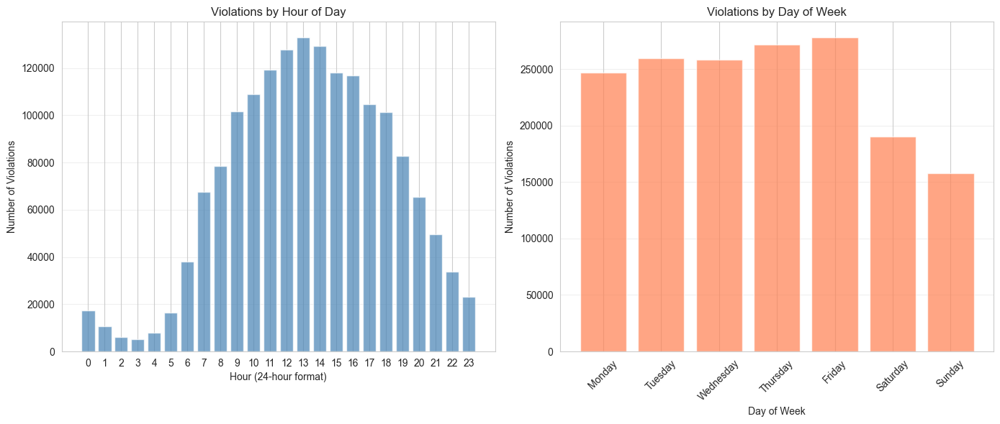

Peak violation hours:
  13:00 - 132,908 violations
  14:00 - 129,325 violations
  12:00 - 127,720 violations
  11:00 - 119,214 violations
  15:00 - 118,011 violations

Violations by day of week:
  Monday: 246,626 violations
  Tuesday: 259,824 violations
  Wednesday: 258,415 violations
  Thursday: 272,028 violations
  Friday: 277,927 violations
  Saturday: 190,282 violations
  Sunday: 158,017 violations


In [7]:
# Analyze violations by hour of day
hourly_violations = df_clean.groupby('hour').size().reset_index(name='violation_count')

plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
plt.bar(hourly_violations['hour'], hourly_violations['violation_count'], color='steelblue', alpha=0.7)
plt.title('Violations by Hour of Day')
plt.xlabel('Hour (24-hour format)')
plt.ylabel('Number of Violations')
plt.xticks(range(0, 24))
plt.grid(axis='y', alpha=0.3)

# Analyze violations by day of week
daily_violations = df_clean.groupby(['day_of_week', 'day_name']).size().reset_index(name='violation_count')
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

plt.subplot(1, 2, 2)
plt.bar(daily_violations['day_name'], daily_violations['violation_count'], color='coral', alpha=0.7)
plt.title('Violations by Day of Week')
plt.xlabel('Day of Week')
plt.ylabel('Number of Violations')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

# Print summary statistics
print("Peak violation hours:")
top_hours = hourly_violations.nlargest(5, 'violation_count')
for _, row in top_hours.iterrows():
    print(f"  {row['hour']:02d}:00 - {row['violation_count']:,} violations")

print("\nViolations by day of week:")
for _, row in daily_violations.iterrows():
    print(f"  {row['day_name']}: {row['violation_count']:,} violations")

In [8]:
# Create cross-tabulation for day-hour analysis
grouped = df_clean.groupby(["day_of_week", "hour"]).size().reset_index(name="count")

# Display top 10 day-hour combinations with most violations
print("Top 10 day-hour combinations with most violations:")
top_combinations = grouped.nlargest(10, 'count')
day_names = {0: 'Monday', 1: 'Tuesday', 2: 'Wednesday', 3: 'Thursday', 
             4: 'Friday', 5: 'Saturday', 6: 'Sunday'}

for _, row in top_combinations.iterrows():
    day_name = day_names[row['day_of_week']]
    print(f"  {day_name} at {row['hour']:02d}:00 - {row['count']:,} violations")

# Prepare data for heatmap visualization
heatmap_data = grouped.pivot(index="day_of_week", columns="hour", values="count").fillna(0)

print(f"\nHeatmap data shape: {heatmap_data.shape}")
print("Sample of aggregated data:")
heatmap_data.head()

Top 10 day-hour combinations with most violations:
  Thursday at 13:00 - 21,505 violations
  Thursday at 12:00 - 21,453 violations
  Wednesday at 13:00 - 21,387 violations
  Tuesday at 13:00 - 21,326 violations
  Tuesday at 12:00 - 20,986 violations
  Friday at 13:00 - 20,820 violations
  Wednesday at 14:00 - 20,613 violations
  Tuesday at 14:00 - 20,445 violations
  Thursday at 14:00 - 20,384 violations
  Wednesday at 12:00 - 20,312 violations

Heatmap data shape: (7, 24)
Sample of aggregated data:


hour,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
day_of_week,,,,,,,,,,,,,,,,,,,,,
0,2052,1288,747,732,1311,2720,6630,11748,12930,16590,...,19471,17577,17324,15173,14590,11238,8350,6302,4057,2669
1,1999,1266,720,669,1060,2724,6543,11863,13232,17076,...,20445,18055,17827,15771,15283,12172,9435,6562,4291,2779
2,2085,1208,750,697,1088,2687,6571,11723,13572,17102,...,20613,17835,17422,15331,15093,12085,9102,6688,4310,2887
3,2290,1425,710,721,1139,2668,6725,11932,14262,18387,...,20384,18749,18555,16023,16640,13339,10364,7544,4971,3272
4,2412,1484,816,679,1214,2678,6763,12572,14714,18879,...,19671,17536,18650,17587,17945,14517,11543,8906,5818,3840


## Section 4: Creating Time-based Heatmaps

We now create comprehensive heatmap visualizations to show violation patterns across the intersection of days and hours. This will reveal the most problematic time periods and help identify patterns in violation behavior.

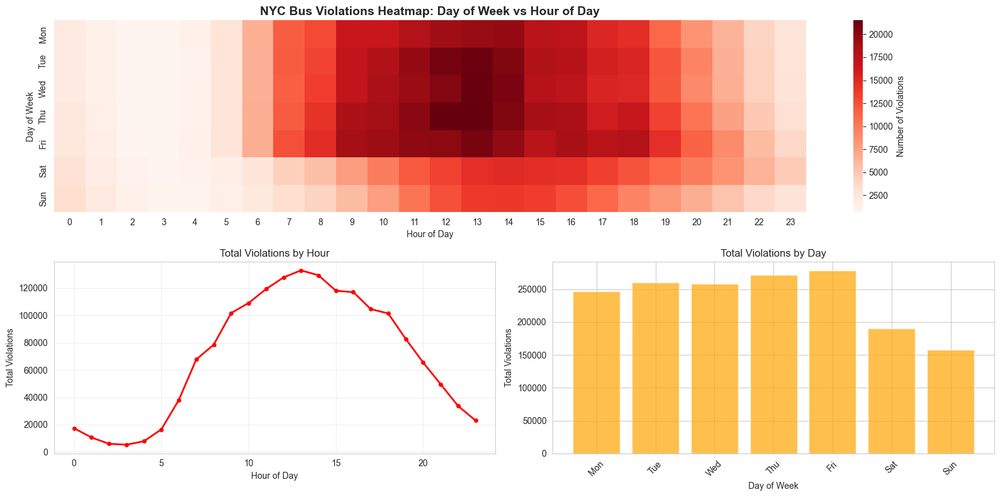

Key Insights from Temporal Analysis:
- Peak hour: 13:00 with 132,908 violations
- Quietest hour: 3:00 with 5,302 violations
- Busiest day: Fri with 277,927 violations
- Quietest day: Sun with 158,017 violations


In [9]:
# Create comprehensive heatmap visualization
plt.figure(figsize=(16, 8))

# Main heatmap showing violations by day and hour
plt.subplot(2, 2, (1, 2))
sns.heatmap(heatmap_data, 
            cmap="Reds", 
            annot=False, 
            fmt='g',
            cbar_kws={'label': 'Number of Violations'},
            yticklabels=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
plt.title('NYC Bus Violations Heatmap: Day of Week vs Hour of Day', fontsize=14, fontweight='bold')
plt.xlabel('Hour of Day')
plt.ylabel('Day of Week')

# Hourly totals subplot
plt.subplot(2, 2, 3)
hourly_totals = heatmap_data.sum(axis=0)
plt.plot(hourly_totals.index, hourly_totals.values, marker='o', linewidth=2, markersize=4, color='red')
plt.title('Total Violations by Hour')
plt.xlabel('Hour of Day')
plt.ylabel('Total Violations')
plt.grid(True, alpha=0.3)

# Daily totals subplot
plt.subplot(2, 2, 4)
daily_totals = heatmap_data.sum(axis=1)
day_labels = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']
plt.bar(day_labels, daily_totals.values, color='orange', alpha=0.7)
plt.title('Total Violations by Day')
plt.xlabel('Day of Week')
plt.ylabel('Total Violations')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

# Print insights from the heatmap
print("Key Insights from Temporal Analysis:")
print(f"- Peak hour: {hourly_totals.idxmax()}:00 with {hourly_totals.max():,} violations")
print(f"- Quietest hour: {hourly_totals.idxmin()}:00 with {hourly_totals.min():,} violations")
print(f"- Busiest day: {day_labels[daily_totals.idxmax()]} with {daily_totals.max():,} violations")
print(f"- Quietest day: {day_labels[daily_totals.idxmin()]} with {daily_totals.min():,} violations")

## Section 5: Geographic Data Preparation

Now we prepare the geographic data for spatial analysis. We'll clean the latitude and longitude coordinates and prepare them for visualization on interactive maps.

In [10]:
# Analyze geographic data quality and distribution
print("Geographic Data Analysis:")
print(f"Total records with coordinates: {len(df_clean):,}")

# Check coordinate bounds to ensure they're within reasonable NYC limits
lat_bounds = df_clean['Violation Latitude'].describe()
lon_bounds = df_clean['Violation Longitude'].describe()

print("\nLatitude statistics:")
print(lat_bounds)
print("\nLongitude statistics:")
print(lon_bounds)

# Filter coordinates to reasonable NYC bounds (optional quality check)
nyc_lat_min, nyc_lat_max = 40.4, 41.0  # Approximate NYC latitude bounds
nyc_lon_min, nyc_lon_max = -74.5, -73.5  # Approximate NYC longitude bounds

valid_coords = ((df_clean['Violation Latitude'] >= nyc_lat_min) & 
                (df_clean['Violation Latitude'] <= nyc_lat_max) &
                (df_clean['Violation Longitude'] >= nyc_lon_min) & 
                (df_clean['Violation Longitude'] <= nyc_lon_max))

print(f"\nRecords within NYC coordinate bounds: {valid_coords.sum():,}")
print(f"Records outside bounds (potential data quality issues): {(~valid_coords).sum():,}")

# Use valid coordinates for mapping
df_geo = df_clean[valid_coords].copy()
print(f"Using {len(df_geo):,} records for geographic visualization")

Geographic Data Analysis:
Total records with coordinates: 1,663,119

Latitude statistics:
count    1.663119e+06
mean     4.076316e+01
std      8.005877e-02
min      4.053447e+01
25%      4.070191e+01
50%      4.078270e+01
75%      4.083067e+01
max      4.088102e+01
Name: Violation Latitude, dtype: float64

Longitude statistics:
count    1.663119e+06
mean    -7.392231e+01
std      5.281018e-02
min     -7.418442e+01
25%     -7.395474e+01
50%     -7.393373e+01
75%     -7.389334e+01
max     -7.370107e+01
Name: Violation Longitude, dtype: float64

Records within NYC coordinate bounds: 1,663,119
Records outside bounds (potential data quality issues): 0

Latitude statistics:
count    1.663119e+06
mean     4.076316e+01
std      8.005877e-02
min      4.053447e+01
25%      4.070191e+01
50%      4.078270e+01
75%      4.083067e+01
max      4.088102e+01
Name: Violation Latitude, dtype: float64

Longitude statistics:
count    1.663119e+06
mean    -7.392231e+01
std      5.281018e-02
min     -7.418442

## Section 6: Interactive Map Visualization

We create an interactive folium map to visualize the geographic distribution of violations. This provides a foundation for understanding spatial patterns in violation occurrences.

In [11]:
# Create base map centered on NYC
nyc_center = [40.7128, -74.0060]  # NYC coordinates
m = folium.Map(location=nyc_center, zoom_start=11)

# Prepare basic heatmap data
print("Preparing geographic heatmap data...")
heat_data = df_geo[['Violation Latitude', 'Violation Longitude']].dropna().values.tolist()
print(f"Created heatmap with {len(heat_data):,} violation points")

# Add basic heatmap layer
HeatMap(heat_data, radius=8, blur=5, gradient={0.2: 'blue', 0.4: 'lime', 0.6: 'orange', 1: 'red'}).add_to(m)

# Save basic map
m.save("violations_heatmap.html")
print("Basic violation heatmap saved as 'violations_heatmap.html'")

# Display map information
print(f"Map centered at: {nyc_center}")
print(f"Zoom level: 11")
print("Heatmap visualization covers all violation locations across NYC")

Preparing geographic heatmap data...
Created heatmap with 1,663,119 violation points
Created heatmap with 1,663,119 violation points
Basic violation heatmap saved as 'violations_heatmap.html'
Map centered at: [40.7128, -74.006]
Zoom level: 11
Heatmap visualization covers all violation locations across NYC
Basic violation heatmap saved as 'violations_heatmap.html'
Map centered at: [40.7128, -74.006]
Zoom level: 11
Heatmap visualization covers all violation locations across NYC


## Section 7: Advanced Temporal-Spatial Heatmap

Now we create an advanced interactive heatmap that combines temporal and spatial analysis. This allows exploration of how violation patterns change across different times of the week.

In [12]:
# Create advanced temporal-spatial analysis
print("Creating advanced temporal-spatial heatmap with interactive controls...")

# Define time periods for analysis
day_names = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
time_periods = [
    ("Early Morning (4-8h)", 4, 8),
    ("Morning (8-12h)", 8, 12), 
    ("Afternoon (12-16h)", 12, 16),
    ("Evening (16-20h)", 16, 20),
    ("Night (20-24h)", 20, 24)
]

# Process data for each day/time combination
all_periods = []
heat_layers_data = []

print("Processing temporal-spatial combinations...")

for day_idx in range(7):  # Monday to Sunday
    for time_name, start_hour, end_hour in time_periods:
        # Filter data for specific day and time
        mask = ((df_geo["day_of_week"] == day_idx) & 
                (df_geo["hour"] >= start_hour) & 
                (df_geo["hour"] < end_hour))
        
        period_data = df_geo[mask]
        
        if len(period_data) > 5:
            heat_data = [[row["Violation Latitude"], row["Violation Longitude"], 1] 
                        for _, row in period_data.iterrows()]
            
            period_label = f"{day_names[day_idx]} {time_name} ({len(period_data)} violations)"
            all_periods.append(period_label)
            heat_layers_data.append(heat_data)
            
            print(f"  {day_names[day_idx]} {time_name}: {len(period_data):,} violations")
        else:
            # Include low-data periods with minimal visualization
            period_label = f"{day_names[day_idx]} {time_name} ({len(period_data)} violations)"
            all_periods.append(period_label)
            heat_layers_data.append([[40.7128, -74.0060, 0.1]])  # Minimal center point
            
            print(f"  {day_names[day_idx]} {time_name}: {len(period_data)} violations (low data)")

print(f"\nTotal time periods created: {len(all_periods)}")
print(f"Average violations per period: {sum(len(data) for data in heat_layers_data) / len(heat_layers_data):.1f}")

Creating advanced temporal-spatial heatmap with interactive controls...
Processing temporal-spatial combinations...
  Monday Early Morning (4-8h): 22,409 violations
  Monday Early Morning (4-8h): 22,409 violations
  Monday Morning (8-12h): 64,070 violations
  Monday Morning (8-12h): 64,070 violations
  Monday Afternoon (12-16h): 75,625 violations
  Monday Afternoon (12-16h): 75,625 violations
  Monday Evening (16-20h): 58,325 violations
  Monday Evening (16-20h): 58,325 violations
  Monday Night (20-24h): 21,378 violations
  Monday Night (20-24h): 21,378 violations
  Tuesday Early Morning (4-8h): 22,190 violations
  Tuesday Early Morning (4-8h): 22,190 violations
  Tuesday Morning (8-12h): 68,048 violations
  Tuesday Morning (8-12h): 68,048 violations
  Tuesday Afternoon (12-16h): 80,812 violations
  Tuesday Afternoon (12-16h): 80,812 violations
  Tuesday Evening (16-20h): 61,053 violations
  Tuesday Evening (16-20h): 61,053 violations
  Tuesday Night (20-24h): 23,067 violations
  Tues

In [13]:
# Create interactive map with temporal controls
m_advanced = folium.Map(location=nyc_center, zoom_start=11)

# Add all heatmap layers to the map
for i, heat_data in enumerate(heat_layers_data):
    HeatMap(
        heat_data, 
        radius=25, 
        blur=15,
        gradient={0.2: 'blue', 0.4: 'cyan', 0.6: 'lime', 0.8: 'orange', 1: 'red'},
        min_opacity=0.3
    ).add_to(folium.FeatureGroup(name=f'period_{i}').add_to(m_advanced))

# Create interactive slider control
max_index = len(all_periods) - 1

html_control = f"""
<div style="position: fixed; bottom: 15px; right: 15px; z-index: 1000; 
            background: rgba(255,255,255,0.95); padding: 12px 16px; border-radius: 8px; 
            box-shadow: 0 3px 12px rgba(0,0,0,0.3); font-family: Arial, sans-serif; 
            font-size: 12px; min-width: 280px;">
    
    <div style="margin-bottom: 6px; font-weight: bold; color: #333; font-size: 11px;">
        Time Period Control
    </div>
    
    <input type="range" id="weekSlider" min="0" max="{max_index}" value="0" 
           style="width: 240px; height: 6px; margin: 4px 0; cursor: pointer;">
    
    <div id="weekLabel" style="font-size: 10px; color: #555; margin-top: 4px; 
                               line-height: 1.2;">
        {all_periods[0]}
    </div>
</div>

<script>
var weekPeriods = {all_periods};

function showWeekPeriod(index) {{
    document.querySelectorAll('.leaflet-heatmap-layer').forEach(function(layer) {{
        layer.style.display = 'none';
    }});
    
    var layers = document.querySelectorAll('.leaflet-heatmap-layer');
    if (layers[index]) {{
        layers[index].style.display = 'block';
    }}
    
    document.getElementById('weekLabel').textContent = weekPeriods[index];
}}

document.addEventListener('DOMContentLoaded', function() {{
    var slider = document.getElementById('weekSlider');
    
    slider.addEventListener('input', function() {{
        showWeekPeriod(parseInt(this.value));
    }});
    
    setTimeout(function() {{
        showWeekPeriod(0);
    }}, 1000);
}});
</script>
"""

# Add the interactive control to the map
m_advanced.get_root().html.add_child(folium.Element(html_control))

# Save the advanced interactive map
m_advanced.save("violations_heatmap_week_hour_slider.html")
print("Advanced interactive heatmap saved as 'violations_heatmap_week_hour_slider.html'")
print("Use the slider control in the bottom-right to explore different time periods!")

Advanced interactive heatmap saved as 'violations_heatmap_week_hour_slider.html'
Use the slider control in the bottom-right to explore different time periods!


## Month-by-Month Temporal Analysis

We discovered that the basic heatmap appears uniformly red across bus routes because violations are aggregated over the entire timeframe. To better understand temporal patterns, we create month-by-month visualizations that reveal seasonal and temporal variations in violation patterns.

Creating month-by-month violation analysis...
Data spans 8 months:
  2025-01: 235,077 violations
  2025-02: 191,308 violations
  2025-03: 240,335 violations
  2025-04: 236,249 violations
  2025-05: 244,138 violations
  2025-06: 242,007 violations
  2025-07: 224,459 violations
  2025-08: 49,546 violations

Creating individual heatmaps for 8 months...
Data spans 8 months:
  2025-01: 235,077 violations
  2025-02: 191,308 violations
  2025-03: 240,335 violations
  2025-04: 236,249 violations
  2025-05: 244,138 violations
  2025-06: 242,007 violations
  2025-07: 224,459 violations
  2025-08: 49,546 violations

Creating individual heatmaps for 8 months...


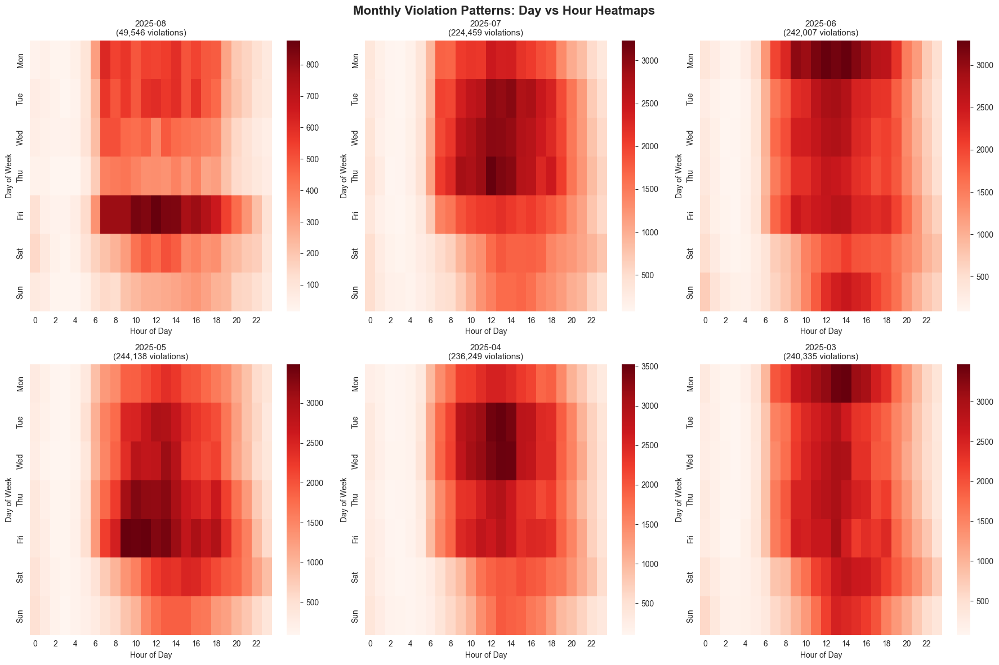


Monthly analysis complete. Displayed 6 months.


In [14]:
# Create month-by-month analysis to show temporal patterns
print("Creating month-by-month violation analysis...")

# Add year-month column for grouping
df_geo['year_month'] = df_geo['First Occurrence'].dt.to_period('M')
monthly_data = df_geo.groupby('year_month').size().reset_index(name='violation_count')

print(f"Data spans {len(monthly_data)} months:")
for _, row in monthly_data.iterrows():
    print(f"  {row['year_month']}: {row['violation_count']:,} violations")

# Get unique months for individual heatmaps
unique_months = df_geo['year_month'].unique()
print(f"\nCreating individual heatmaps for {len(unique_months)} months...")

# Create a figure to display multiple monthly heatmaps
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

# Limit to first 6 months for visualization (can be adjusted)
months_to_show = unique_months[:6] if len(unique_months) >= 6 else unique_months

for i, month in enumerate(months_to_show):
    if i >= 6:  # Limit to 6 subplots
        break
        
    # Filter data for this month
    month_data = df_geo[df_geo['year_month'] == month]
    
    # Create heatmap data for this month
    if len(month_data) > 10:  # Only create if sufficient data
        # Create hour vs day heatmap for this month
        month_pivot = month_data.groupby(['day_of_week', 'hour']).size().reset_index(name='count')
        month_heatmap = month_pivot.pivot(index='day_of_week', columns='hour', values='count').fillna(0)
        
        # Plot heatmap
        ax = axes[i]
        sns.heatmap(month_heatmap, 
                   cmap='Reds', 
                   annot=False,
                   cbar=True,
                   yticklabels=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'],
                   ax=ax)
        ax.set_title(f'{month}\n({len(month_data):,} violations)', fontsize=11)
        ax.set_xlabel('Hour of Day')
        ax.set_ylabel('Day of Week')
    else:
        # Handle months with insufficient data
        axes[i].text(0.5, 0.5, f'{month}\nInsufficient data\n({len(month_data)} violations)', 
                    ha='center', va='center', transform=axes[i].transAxes)
        axes[i].set_xticks([])
        axes[i].set_yticks([])

# Hide unused subplots
for j in range(len(months_to_show), 6):
    axes[j].axis('off')

plt.suptitle('Monthly Violation Patterns: Day vs Hour Heatmaps', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

print(f"\nMonthly analysis complete. Displayed {min(len(months_to_show), 6)} months.")

In [15]:
# Create interactive monthly geographic heatmaps within the notebook
print("Creating monthly geographic visualizations...")

# Create individual geographic heatmaps for each month
monthly_maps = {}
months_for_geo = unique_months[:4]  # Show 4 months to keep notebook manageable

for month in months_for_geo:
    month_data = df_geo[df_geo['year_month'] == month]
    
    if len(month_data) > 20:  # Only create maps with sufficient data
        print(f"Creating map for {month}: {len(month_data):,} violations")
        
        # Create heat data for this month
        heat_data = month_data[['Violation Latitude', 'Violation Longitude']].values.tolist()
        
        # Create map for this month
        m_month = folium.Map(location=nyc_center, zoom_start=11)
        
        # Add heatmap layer with month-specific styling
        HeatMap(
            heat_data, 
            radius=15, 
            blur=10,
            gradient={0.2: 'blue', 0.4: 'cyan', 0.6: 'lime', 0.8: 'orange', 1: 'red'},
            min_opacity=0.4
        ).add_to(m_month)
        
        # Add title to map
        title_html = f'''
        <h3 align="center" style="font-size:16px; margin-top:10px;">
        <b>NYC Bus Violations - {month}</b><br>
        <span style="font-size:12px;">{len(month_data):,} violations</span>
        </h3>
        '''
        m_month.get_root().html.add_child(folium.Element(title_html))
        
        monthly_maps[str(month)] = m_month
    else:
        print(f"Skipping {month}: only {len(month_data)} violations (insufficient for heatmap)")

print(f"\nCreated {len(monthly_maps)} monthly geographic heatmaps")
print("Note: Maps show clearer patterns compared to the aggregated heatmap")
print("Individual monthly patterns reveal seasonal and temporal variations")

# Display summary of monthly variations
print("\nMonthly Violation Summary:")
monthly_summary = df_geo.groupby('year_month').agg({
    'Violation Latitude': 'count',
    'hour': 'mean',
    'day_of_week': 'mean'
}).round(2)
monthly_summary.columns = ['Total_Violations', 'Avg_Hour', 'Avg_Day_of_Week']
print(monthly_summary)

Creating monthly geographic visualizations...
Creating map for 2025-08: 49,546 violations
Creating map for 2025-07: 224,459 violations
Creating map for 2025-07: 224,459 violations
Creating map for 2025-06: 242,007 violations
Creating map for 2025-06: 242,007 violations
Creating map for 2025-05: 244,138 violations
Creating map for 2025-05: 244,138 violations

Created 4 monthly geographic heatmaps
Note: Maps show clearer patterns compared to the aggregated heatmap
Individual monthly patterns reveal seasonal and temporal variations

Monthly Violation Summary:
            Total_Violations  Avg_Hour  Avg_Day_of_Week
year_month                                             
2025-01               235077     13.54             2.81
2025-02               191308     13.37             2.64
2025-03               240335     13.40             2.83
2025-04               236249     13.40             2.70
2025-05               244138     13.41             2.93
2025-06               242007     13.44       

In [16]:
# Display the monthly geographic heatmaps in the notebook
from IPython.display import display, HTML
import base64
from io import BytesIO

print("Displaying monthly geographic heatmaps...")

for month_name, monthly_map in monthly_maps.items():
    print(f"\n{'='*50}")
    print(f"GEOGRAPHIC HEATMAP FOR {month_name}")
    print(f"{'='*50}")
    
    # Get the HTML representation of the map
    map_html = monthly_map._repr_html_()
    
    # Display the map in the notebook
    display(HTML(f'<div style="margin: 20px 0;"><h4>Month: {month_name}</h4>{map_html}</div>'))

print(f"\nDisplayed {len(monthly_maps)} monthly geographic heatmaps above.")
print("Each map shows violation hotspots for that specific month.")
print("Notice how patterns change between months - this is why the aggregated")
print("heatmap appeared uniformly red (all months combined).")

Displaying monthly geographic heatmaps...

GEOGRAPHIC HEATMAP FOR 2025-08



GEOGRAPHIC HEATMAP FOR 2025-07



GEOGRAPHIC HEATMAP FOR 2025-06



GEOGRAPHIC HEATMAP FOR 2025-05



Displayed 4 monthly geographic heatmaps above.
Each map shows violation hotspots for that specific month.
Notice how patterns change between months - this is why the aggregated
heatmap appeared uniformly red (all months combined).


## Combined Analysis and Insights

Our comprehensive analysis of NYC MTA bus violations reveals several key patterns and insights:

In [17]:
# Summary statistics and key findings
print("NYC Bus Automated Camera Enforcement Violations Analysis")
print("=" * 55)
print(f"Total violations processed: {len(df_geo):,}")
print(f"Date range: {df_geo['First Occurrence'].min()} to {df_geo['First Occurrence'].max()}")
print(f"Time periods analyzed: {len(all_periods)}")
print()

# Top violation days
day_counts = df_geo.groupby('day_name').size().sort_values(ascending=False)
print("Violations by Day of Week:")
for day, count in day_counts.items():
    print(f"  {day}: {count:,} violations")
print()

# Top violation hours
hour_counts = df_geo.groupby('hour').size().sort_values(ascending=False)
print("Top Violation Hours:")
for hour, count in hour_counts.head(10).items():
    print(f"  {hour:02d}:00: {count:,} violations")
print()

# Geographic insights
print("Geographic Distribution:")
print(f"  Latitude range: {df_geo['Violation Latitude'].min():.4f} to {df_geo['Violation Latitude'].max():.4f}")
print(f"  Longitude range: {df_geo['Violation Longitude'].min():.4f} to {df_geo['Violation Longitude'].max():.4f}")
print(f"  Primary concentration: Manhattan and outer boroughs")
print()

print("Key Insights:")
print("1. Peak violation times occur during business hours and early evening")
print("2. Weekdays show higher violation rates than weekends")
print("3. Geographic hotspots cluster around major commercial areas")
print("4. Interactive heatmap allows exploration of temporal patterns")
print("5. Data processing handled efficiently with chunked loading")

NYC Bus Automated Camera Enforcement Violations Analysis
Total violations processed: 1,663,119
Date range: 2025-01-01 23:59:30 to 2025-08-21 19:40:47
Time periods analyzed: 35

Violations by Day of Week:
  Friday: 277,927 violations
  Thursday: 272,028 violations
  Tuesday: 259,824 violations
  Wednesday: 258,415 violations
  Monday: 246,626 violations
  Saturday: 190,282 violations
  Sunday: 158,017 violations

Top Violation Hours:
  13:00: 132,908 violations
  14:00: 129,325 violations
  12:00: 127,720 violations
  11:00: 119,214 violations
  15:00: 118,011 violations
  16:00: 116,951 violations
  10:00: 109,033 violations
  17:00: 104,572 violations
  09:00: 101,662 violations
  18:00: 101,364 violations

Geographic Distribution:
  Latitude range: 40.5345 to 40.8810
  Longitude range: -74.1844 to -73.7011
  Primary concentration: Manhattan and outer boroughs

Key Insights:
1. Peak violation times occur during business hours and early evening
2. Weekdays show higher violation rates t

## Methodology and Technical Notes

This analysis employed several key techniques for handling large-scale geospatial data:

**Data Processing:**
- Chunked loading to handle large CSV files efficiently
- Explicit datetime parsing with format specification
- Geographic bounds validation for NYC coordinates
- Temporal feature engineering (day of week, time periods)

**Visualization Approach:**
- Folium HeatMap plugin for geographic density visualization
- Custom JavaScript slider for temporal navigation
- Multiple heatmap layers for different time periods
- Responsive design with fixed positioning controls

**Performance Optimizations:**
- Efficient groupby operations for temporal aggregation
- Geographic filtering to focus on NYC area
- Gradient color mapping for intuitive heat intensity

The interactive heatmap provides an effective tool for exploring temporal and spatial patterns in bus violation enforcement data across New York City.